<a href="https://colab.research.google.com/github/isshii/de4test/blob/test_ozawa/DeepXplore/DeepXplore_04_01_coverage_plot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# 共通で使うパスなどの定義
# 共通の変数設定
# 共通フォルダパス

import datetime
import pytz
dt_now = datetime.datetime.now(pytz.timezone('Asia/Tokyo'))
dt_str = str(dt_now.strftime('%Y%m%d_%H%M'))

data_dir = "/content/gdrive/My Drive/ColabNotebooks/test4ai/data"
#data_imagenet = "/content/gdrive/My Drive/ColabNotebooks/test4ai/data/ImageNet"
data_mnist = "/content/gdrive/My Drive/ColabNotebooks/test4ai/data/MNIST"
#data_imagenet_seeds = "/content/gdrive/My Drive/ColabNotebooks/test4ai/data/ImageNet/seeds"
model_dir = "/content/gdrive/My Drive/ColabNotebooks/test4ai/model"
#output_dir = "/content/gdrive/My Drive/ColabNotebooks/test4ai/output"
output_dir = "/content/gdrive/My Drive/ColabNotebooks/test4ai/output/" + dt_str
tmp_dir = "/content/gdrive/My Drive/ColabNotebooks/test4ai/tmp"

In [17]:
# Goggle Drive つなぐ
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [18]:
import sys
import argparse
import pandas as pd
pd.options.display.float_format = '{:.3f}'.format

%tensorflow_version 1.x
from keras.datasets import mnist
from keras.layers import Input
import imageio

from __future__ import print_function

from keras.datasets import mnist
from keras.layers import Convolution2D, MaxPooling2D, Input, Dense, Activation, Flatten
from keras.models import Model
from keras.utils import to_categorical
import os

# TensorFlowでGPUを使っているかのチェック：
# "device_type: "GPU" " があればOK
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 13464436680686528976, name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 17395840647838938709
 physical_device_desc: "device: XLA_CPU device"]

In [19]:
parser = argparse.ArgumentParser(description='Main function for difference-inducing input generation in MNIST dataset')
parser.add_argument('transformation', help="realistic transformation type", choices=['light', 'occl', 'blackout'])
parser.add_argument('weight_diff', help="weight hyperparm to control differential behavior", type=float)
parser.add_argument('weight_nc', help="weight hyperparm to control neuron coverage", type=float)
parser.add_argument('step', help="step size of gradient descent", type=float)
parser.add_argument('seeds', help="number of seeds of input", type=int)
parser.add_argument('grad_iterations', help="number of iterations of gradient descent", type=int)
parser.add_argument('threshold', help="threshold for determining neuron activated", type=float)
parser.add_argument('-t', '--target_model', help="target model that we want it predicts differently",
                    choices=[0, 1, 2], default=0, type=int)
parser.add_argument('-sp', '--start_point', help="occlusion upper left corner coordinate", default=(0, 0), type=tuple)
parser.add_argument('-occl_size', '--occlusion_size', help="occlusion size", default=(10, 10), type=tuple)
noise_type = "light" #@param ["light", "occl", "blackout"]
weight_diff = "0.1" #@param {type:"string"}
weight_nc = "0.1" #@param {type:"string"}
step = "10" #@param {type:"string"}　#50だとほぼ白飛び
seeds = "5" #@param {type:"string"}
grad_iterations = "20" #@param {type:"string"}
threshold = "0.1" #@param {type:"string"}

args = parser.parse_args([noise_type, weight_diff, weight_nc, step, seeds, grad_iterations, threshold])

length = int(args.seeds)

df2_scale = pd.DataFrame()
df3_scale = pd.DataFrame()
df4_scale = pd.DataFrame()
for start_fig in range(10):
  df1_scale = pd.read_csv(output_dir[:-14]+ "/01_fig" + str(start_fig) + "_seed" + str(length) +"_neuron.csv")
  df2_scale = pd.concat([df2_scale, df1_scale])

  df1_scale = pd.read_csv(output_dir[:-14]+ "/01_fig" + str(start_fig) + "_seed" + str(length) +"_index.csv")
  df3_scale = pd.concat([df3_scale, df1_scale])

  df1_scale = pd.read_csv(output_dir[:-14]+ "/01_fig" + str(start_fig) + "_seed" + str(length) +"_trace.csv")
  df4_scale = pd.concat([df4_scale, df1_scale])

tmp_list = list(df2_scale.iloc[:,0])
df2_scale.index = tmp_list
print(df2_scale.iloc[:,1:].head())

tmp_list = list(df3_scale.iloc[:,0])
df3_scale.index = tmp_list
print(df3_scale.iloc[:,1:].head())

tmp_list = list(df4_scale.iloc[:,0])
df4_scale.index = tmp_list
print(df4_scale.iloc[:,1:].head())

     ('block1_conv1', 0)  ...  ('predictions', 9)
0_1                0.405  ...               0.000
0_2                0.036  ...               0.000
0_3                0.427  ...               0.000
0_4                0.158  ...               0.000
0_5                0.392  ...               0.000

[5 rows x 52 columns]
     already_diff  found  not_found  ... index2        layer3 index3
0_1             0      3          0  ...     61           fc1     30
0_2             0      2          0  ...      3   predictions      7
0_3             0      3          0  ...      5           fc2     36
0_4             0      0          1  ...     12           fc2     10
0_5             0      5          0  ...     22  block2_conv1      5

[5 rows x 9 columns]
       ('block1_conv1', 0)  ...  ('predictions', 9)
0_1_0                0.155  ...               0.000
0_1_1                0.070  ...               0.000
0_1_2                0.405  ...               0.000
0_2_0                0.211  ...  

In [20]:
df4_scale.head(20)

,Unnamed: 0,"('block1_conv1', 0)","('block1_conv1', 1)","('block1_conv1', 2)","('block1_conv1', 3)","('block1_pool1', 0)","('block1_pool1', 1)","('block1_pool1', 2)","('block1_pool1', 3)","('block2_conv1', 0)","('block2_conv1', 1)","('block2_conv1', 2)","('block2_conv1', 3)","('block2_conv1', 4)","('block2_conv1', 5)","('block2_conv1', 6)","('block2_conv1', 7)","('block2_conv1', 8)","('block2_conv1', 9)","('block2_conv1', 10)","('block2_conv1', 11)","('block2_pool1', 0)","('block2_pool1', 1)","('block2_pool1', 2)","('block2_pool1', 3)","('block2_pool1', 4)","('block2_pool1', 5)","('block2_pool1', 6)","('block2_pool1', 7)","('block2_pool1', 8)","('block2_pool1', 9)","('block2_pool1', 10)","('block2_pool1', 11)","('before_softmax', 0)","('before_softmax', 1)","('before_softmax', 2)","('before_softmax', 3)","('before_softmax', 4)","('before_softmax', 5)","('before_softmax', 6)","('before_softmax', 7)","('before_softmax', 8)","('before_softmax', 9)","('predictions', 0)","('predictions', 1)","('predictions', 2)","('predictions', 3)","('predictions', 4)","('predictions', 5)","('predictions', 6)","('predictions', 7)","('predictions', 8)","('predictions', 9)"
0_1_0,0_1_0,0.155,0.137,0.078,0.221,0.211,0.170,0.115,0.280,0.090,0.092,0.076,0.103,0.114,0.050,0.067,0.097,0.068,0.071,0.063,0.132,0.161,0.162,0.123,0.192,0.201,0.088,0.123,0.172,0.127,0.123,0.104,0.201,1.000,0.000,0.339,0.224,0.058,0.332,0.640,0.415,0.275,0.317,1.000,0.000,0.000,0.000,0.000,0.000,0.001,0.000,0.000,0.000
0_1_1,0_1_1,0.070,0.025,0.101,0.055,0.114,0.041,0.155,0.090,0.050,0.035,0.145,0.049,0.061,0.031,0.022,0.065,0.062,0.070,0.105,0.064,0.095,0.072,0.241,0.103,0.124,0.060,0.054,0.120,0.116,0.124,0.176,0.108,1.000,0.322,0.634,0.491,0.000,0.687,0.680,0.407,0.250,0.302,1.000,0.000,0.007,0.001,0.000,0.014,0.013,0.000,0.000,0.000
0_1_2,0_1_2,0.405,0.381,0.114,0.618,0.447,0.404,0.144,0.659,0.103,0.197,0.010,0.181,0.265,0.115,0.182,0.179,0.137,0.077,0.041,0.236,0.154,0.280,0.027,0.272,0.343,0.180,0.263,0.240,0.206,0.122,0.062,0.304,1.000,0.000,0.568,0.210,0.243,0.160,0.649,0.351,0.852,0.097,1.000,0.000,0.000,0.000,0.000,0.000,0.002,0.000,0.067,0.000
0_2_0,0_2_0,0.211,0.191,0.096,0.309,0.277,0.230,0.144,0.370,0.091,0.103,0.062,0.105,0.120,0.056,0.078,0.104,0.078,0.074,0.070,0.143,0.164,0.183,0.130,0.203,0.202,0.091,0.125,0.188,0.152,0.132,0.141,0.232,1.000,0.123,0.563,0.318,0.000,0.550,0.673,0.182,0.635,0.215,1.000,0.000,0.000,0.000,0.000,0.000,0.001,0.000,0.000,0.000
0_2_1,0_2_1,0.036,0.003,0.087,0.011,0.064,0.009,0.141,0.022,0.031,0.021,0.136,0.024,0.039,0.026,0.014,0.047,0.060,0.060,0.110,0.036,0.063,0.046,0.241,0.053,0.084,0.044,0.026,0.100,0.119,0.105,0.207,0.076,1.000,0.554,0.971,0.742,0.000,0.993,0.882,0.238,0.704,0.315,1.000,0.002,0.673,0.030,0.000,0.910,0.200,0.000,0.018,0.000
0_3_0,0_3_0,0.232,0.216,0.088,0.350,0.293,0.248,0.120,0.405,0.102,0.128,0.030,0.134,0.146,0.059,0.104,0.109,0.084,0.063,0.043,0.157,0.172,0.218,0.061,0.242,0.243,0.110,0.170,0.164,0.137,0.123,0.099,0.240,1.000,0.000,0.318,0.214,0.147,0.409,0.557,0.405,0.626,0.395,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
0_3_1,0_3_1,0.063,0.019,0.085,0.042,0.108,0.034,0.130,0.073,0.074,0.064,0.164,0.079,0.084,0.030,0.044,0.066,0.083,0.080,0.126,0.081,0.141,0.136,0.317,0.163,0.177,0.067,0.082,0.129,0.141,0.162,0.262,0.152,1.000,0.116,0.532,0.351,0.000,0.707,0.640,0.434,0.464,0.416,1.000,0.000,0.003,0.000,0.000,0.027,0.012,0.001,0.001,0.001
0_3_2,0_3_2,0.427,0.401,0.119,0.650,0.470,0.424,0.146,0.692,0.099,0.194,0.004,0.180,0.257,0.110,0.183,0.168,0.132,0.067,0.043,0.221,0.147,0.281,0.012,0.268,0.326,0.172,0.258,0.213,0.193,0.114,0.061,0.288,0.988,0.000,0.524,0.285,0.227,0.273,0.455,0.314,1.000,0.208,0.756,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000
0_4_0,0_4_0,0.184,0.161,0.098,0.259,0.244,0.201,0.143,0.329,0.096,0.096,0.096,0.097,0.117,0.057,0.064,0.110,0.070,0.085,0.070,0.152,0.160,0.167,0.164,0.174,0.184,0.108,0.113,0.181,0.121,0.146,0.126,0.240,1.000,0.000,0.571,0.287,0.241,0.55

In [0]:
df1_scale = pd.read_csv(output_dir[:-14]+ "/01_fig" + str(start_fig) + "_seed" + str(length) +"_trace.csv")

In [22]:
output_dir[:-14]

'/content/gdrive/My Drive/ColabNotebooks/test4ai/output'

In [23]:
print(df1_scale.columns[1:])
print(df1_scale.columns[2])
print(type(df1_scale.columns[2]))
print(df1_scale.columns[2].find(","))
com_pos = df1_scale.columns[2].find(",")
print(df1_scale.columns[2][com_pos])
print(df1_scale.columns[2][com_pos+1:-1])


Index(['('block1_conv1', 0)', '('block1_conv1', 1)', '('block1_conv1', 2)',
       '('block1_conv1', 3)', '('block1_pool1', 0)', '('block1_pool1', 1)',
       '('block1_pool1', 2)', '('block1_pool1', 3)', '('block2_conv1', 0)',
       '('block2_conv1', 1)', '('block2_conv1', 2)', '('block2_conv1', 3)',
       '('block2_conv1', 4)', '('block2_conv1', 5)', '('block2_conv1', 6)',
       '('block2_conv1', 7)', '('block2_conv1', 8)', '('block2_conv1', 9)',
       '('block2_conv1', 10)', '('block2_conv1', 11)', '('block2_pool1', 0)',
       '('block2_pool1', 1)', '('block2_pool1', 2)', '('block2_pool1', 3)',
       '('block2_pool1', 4)', '('block2_pool1', 5)', '('block2_pool1', 6)',
       '('block2_pool1', 7)', '('block2_pool1', 8)', '('block2_pool1', 9)',
       '('block2_pool1', 10)', '('block2_pool1', 11)', '('before_softmax', 0)',
       '('before_softmax', 1)', '('before_softmax', 2)',
       '('before_softmax', 3)', '('before_softmax', 4)',
       '('before_softmax', 5)', '('before_so

In [24]:
df1_scale.columns[-1]

"('predictions', 9)"

In [25]:
import numpy as np
temp_x = 0
x = np.array([])
y = np.array([])
#for column in df1_scale.columns[1:]:
for column in df1_scale.columns[2:]:
  com_pos = column.find(",")
  #print(column[com_pos+1:-1])
  index = column[com_pos+1:-1]

  if int(index) == 0:
    print(column[2:com_pos-1])
    temp_x +=0.1
    num_index = int(index_before)
    print(num_index)
    for int_y in range(num_index+1):
#      print(int_y)
      temp_y = -int_y + (num_index-1)*0.5
      x = np.append(x, temp_x)
      y = np.append(y, temp_y)
      #print(y, temp_y)

  if column == df1_scale.columns[-1]:
    temp_x +=0.1
    num_index = int(index)
    print(num_index)
    for int_y in range(num_index+1):
      temp_y = -int_y + (num_index-1)*0.5
      x = np.append(x, temp_x)
      y = np.append(y, temp_y)

  index_before = index

print(x, y)



block1_pool1
3
block2_conv1
3
block2_pool1
11
before_softmax
11
predictions
9
9
[0.1 0.1 0.1 0.1 0.2 0.2 0.2 0.2 0.3 0.3 0.3 0.3 0.3 0.3 0.3 0.3 0.3 0.3
 0.3 0.3 0.4 0.4 0.4 0.4 0.4 0.4 0.4 0.4 0.4 0.4 0.4 0.4 0.5 0.5 0.5 0.5
 0.5 0.5 0.5 0.5 0.5 0.5 0.6 0.6 0.6 0.6 0.6 0.6 0.6 0.6 0.6 0.6] [ 1.  0. -1. -2.  1.  0. -1. -2.  5.  4.  3.  2.  1.  0. -1. -2. -3. -4.
 -5. -6.  5.  4.  3.  2.  1.  0. -1. -2. -3. -4. -5. -6.  4.  3.  2.  1.
  0. -1. -2. -3. -4. -5.  4.  3.  2.  1.  0. -1. -2. -3. -4. -5.]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


IndexError: ignored

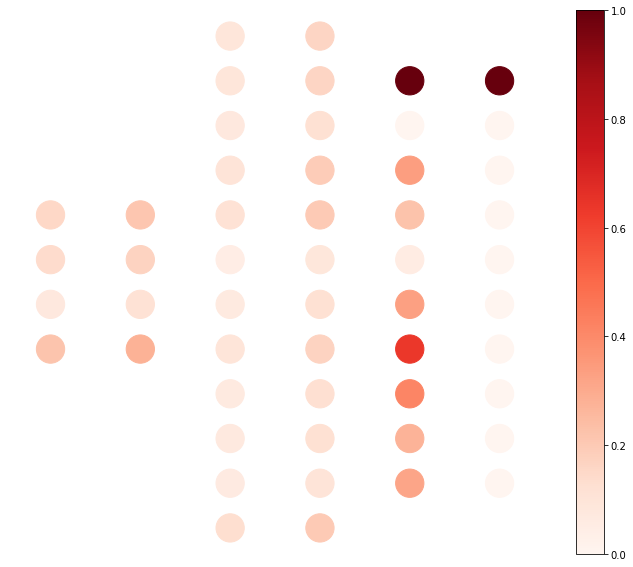

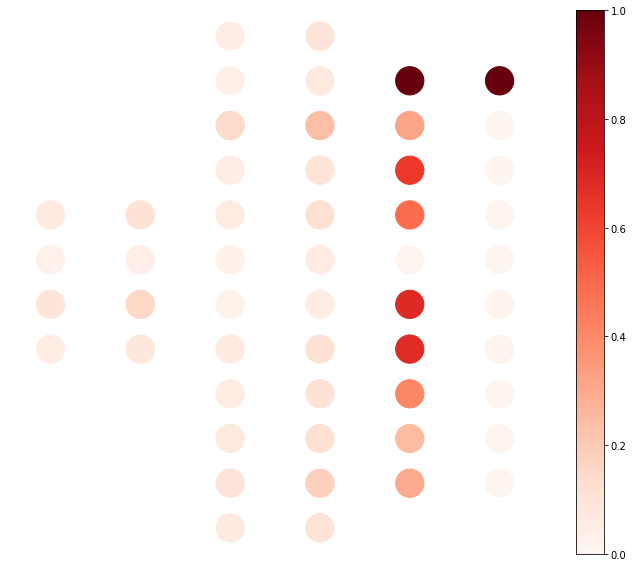

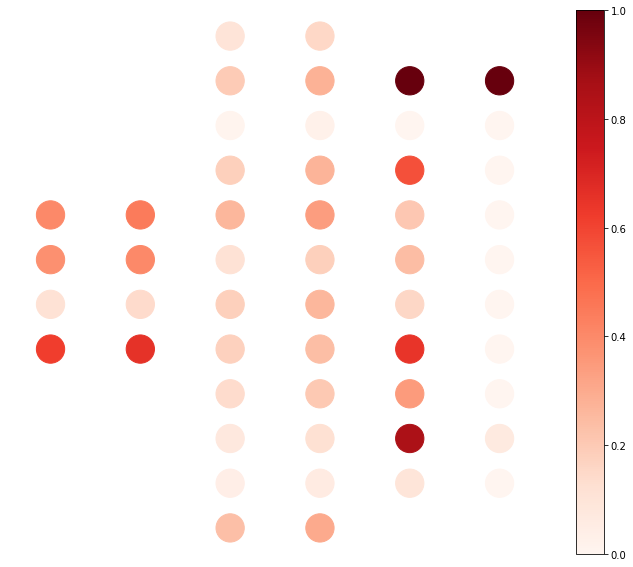

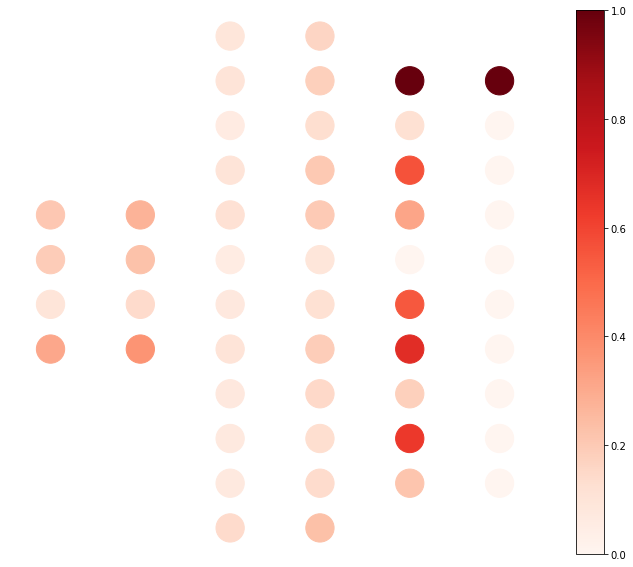

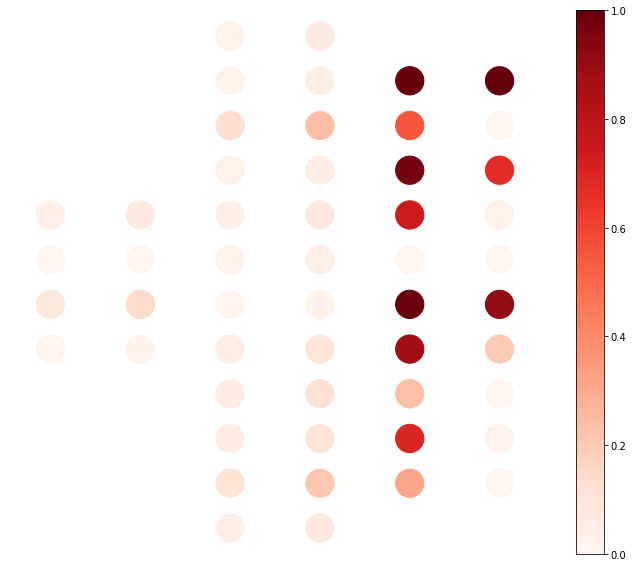

...

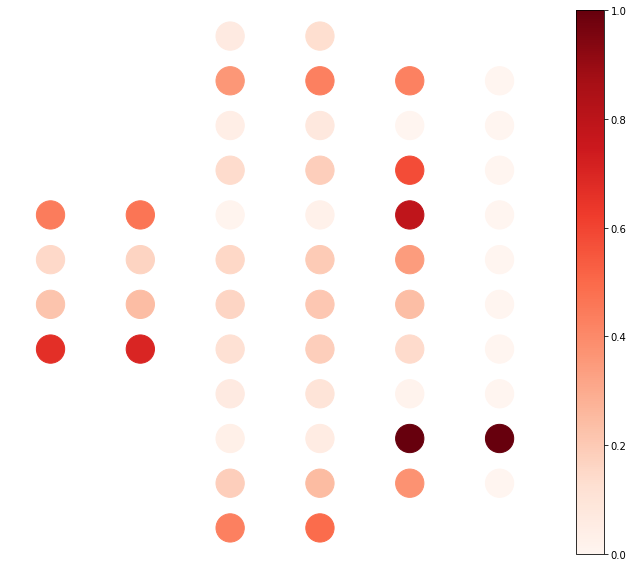

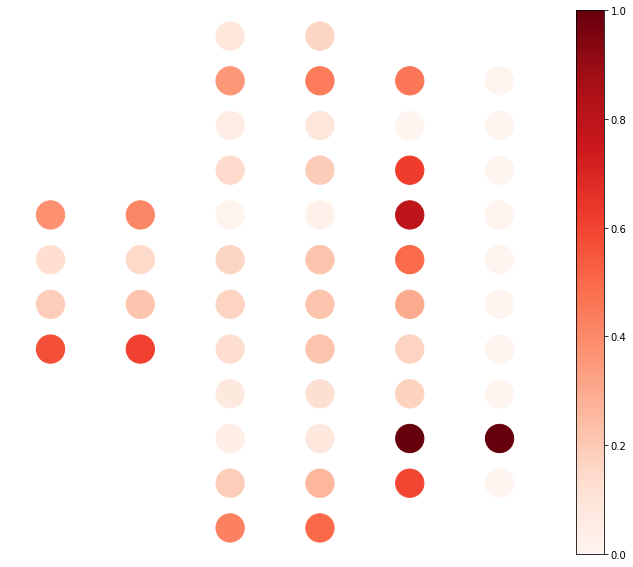

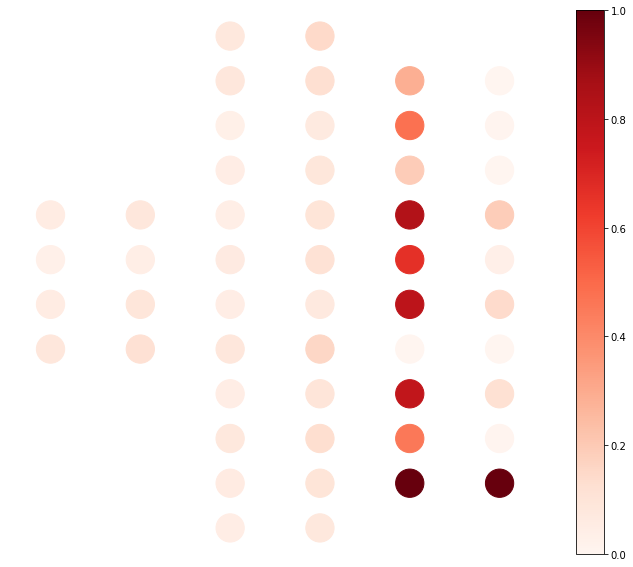

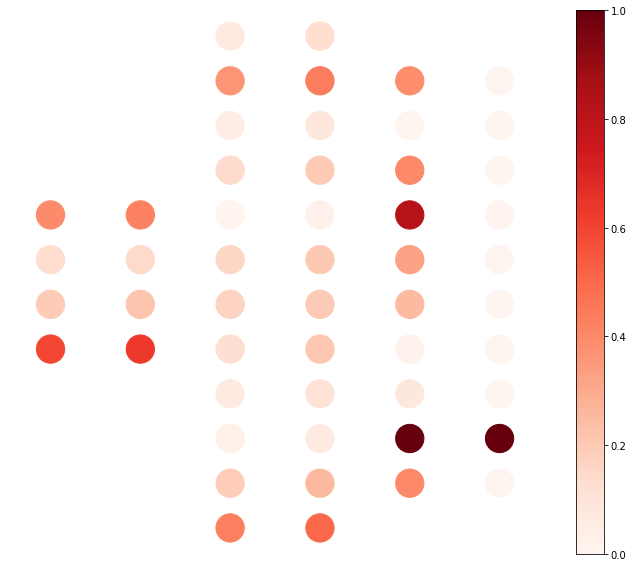

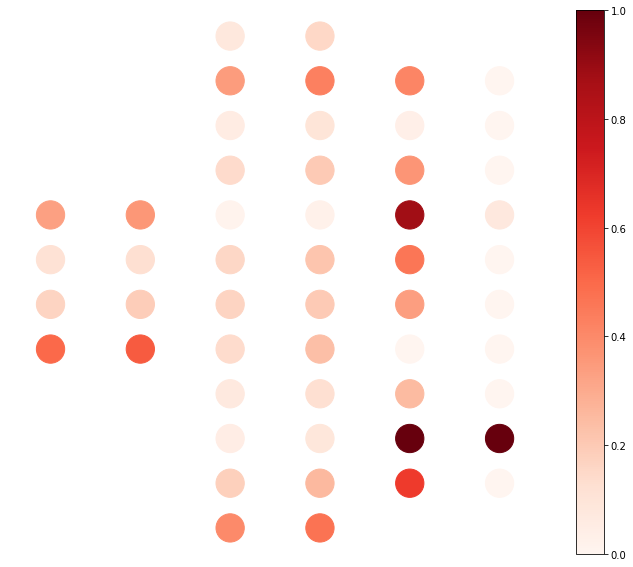

<Figure size 864x720 with 0 Axes>

In [38]:
import matplotlib.pyplot as plt
#plt.scatter(x,y, s=800)
for i in range(df4_scale.size):
  plt.figure(figsize=[12,10])
  plt.scatter(x,y, s=800, c=list(df4_scale.iloc[i][1:]), cmap= "Reds")
  plt.colorbar()
  plt.axis("off")
  plt.savefig(output_dir[:-14]+ "/neuron/" + df4_scale.iloc[i][0] + ".png")

In [27]:
i = 3
df4_scale.iloc[i][0]

'0_2_0'

In [33]:
df4_scale.size

16801